# Build neighbourhood VDJ feature space

In [1]:
import palantir

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [2]:
import dandelion as ddl

In [3]:
# import gspread as gs
import numpy as np
import seaborn as sns
import os
import pandas as pd

In [4]:
import scanpy as sc

In [5]:
from collections import Counter
import matplotlib.pyplot as plt

In [6]:
os.chdir('/nfs/team205/ny1/milopy/milopy/')
# import milopy
import core as milo
ddl.logging.print_header()
sc.logging.print_header()

dandelion==0.3.1 pandas==1.4.4 numpy==1.23.5 matplotlib==3.7.1 networkx==3.1 scipy==1.10.1


/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


scanpy==1.9.3 anndata==0.9.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.4.4 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.8


In [7]:
# set working directory


In [8]:
sc.settings.set_figure_params(dpi = 160, color_map = 'RdYlBu_r', dpi_save = 300, format = 'pdf')
plt.rcParams["figure.figsize"] = [6,6]
sns.set_palette('colorblind')

In [9]:
#### need to add this line to restore plotting function of scanpy in the presence of palantir
%matplotlib inline

# Load data

In [7]:
# object loaded with abTCR, gdTCR, BCR data in 02_panfetal_load_VDJ


In [8]:
adata.obs_names

Index(['sample1-TTCTACACAGTGACAG', 'sample1-CATTCGCTCCATGAAC',
       'sample1-GTTAAGCTCTGTTGAG', 'sample1-ACATCAGTCACCGGGT',
       'sample1-AACTCAGCACAGACAG', 'sample1-GGATGTTAGTCGTACT',
       'sample1-CTCGAGGCAGTCAGCC', 'sample1-AGTGAGGCAATAGAGT',
       'sample1-ACGGGTCCACACCGAC', 'sample1-CAACCTCTCATAACCG',
       ...
       'sample12-GAGCAGAGTCGAACAG', 'sample12-AAGGTTCAGCCAGAAC',
       'sample12-CTCGGAGCAACGCACC', 'sample12-TCTGGAAAGAGTGACC',
       'sample12-CCTACCAAGCTAGTTC', 'sample12-TCGCGAGTCTTGGGTA',
       'sample12-ATTGGACCAAACAACA', 'sample12-TATGCCCCAAACAACA',
       'sample12-ATCTGCCTCCGCGTTT', 'sample12-CAACCTCCAAACAACA'],
      dtype='object', name='sample_barcode', length=127654)

In [9]:
adata.obs['anno_CITE_4v3'].value_counts().keys()

CategoricalIndex(['DP(Q)_rearr', 'DP(P)_early', 'DP_4hi8lo',
                  'committed_CD4pos', 'DP_pos_sel', 'SP_CD4_semimature',
                  'DP(Q)_CD199', 'DP(Q)_early', 'SP_CD8_semimature',
                  'DP(Q)_CD99_CD31lo', 'SP_CD4_immature', 'committed_CD4neg',
                  'DP_early_CD31', 'DP(Q)_CD99_CD31hi', 'SP_Treg_mature',
                  'SP_CD8_immature', 'SP_Treg_immature', 'DP(Q)_HSPH1',
                  'CD8aaI_immature', 'SP_CD4_mature', 'CD8aaII_mature',
                  'CD8aaII_immature', 'SP_Treg_PD1', 'CD8aaI_mature',
                  'DP(P)_late', 'SP_CD8_mature', 'gdT_semimature',
                  'SP_Treg_CD8', 'committed_CD4neg(P)', 'NK_tr_itg_hi',
                  'gdT_immature', 'SP_Treg_recirc', 'uncommitted', 'iNKT',
                  'committed_CD4pos(P)', 'SP_CD8_NKlike', 'gdT_mature',
                  'DP(Q)_Th2', 'NK_circ_56hi16lo', 'gdT_Vd2', 'NK_tr_itg_lo',
                  'NK_circ_56lo16hi'],
                 categories=

In [28]:
adata

AnnData object with n_obs × n_vars = 127654 × 36751
    obs: 'n_genes', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spl

In [36]:
# remove old VDJ annotations
adata.obs = adata.obs[adata.obs.columns.drop(
    list(adata.obs.filter(regex='VDJ')) + list(adata.obs.filter(regex='VJ'))+ list(adata.obs.filter(regex='vj')) 
    + list(adata.obs.filter(regex='vdj')) + list(adata.obs.filter(regex='clone')) + list(adata.obs.filter(regex='contig'))
    + list(adata.obs.filter(regex='isotype')) + list(adata.obs.filter(regex='chain')) + list(adata.obs.filter(regex='locus'))
)]
adata

AnnData object with n_obs × n_vars = 127654 × 36751
    obs: 'n_genes', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spl

In [37]:
# set up subsets and colors

ct_all_order = ['uncommitted', 'committed_CD4neg','committed_CD4neg(P)','committed_CD4pos','committed_CD4pos(P)',
                'DP(P)_early', 'DP(P)_late','DP(Q)_early','DP(Q)_rearr','DP(Q)_CD99_CD31lo','DP_early_CD31',
                'DP_4hi8lo','DP(Q)_CD199','DP(Q)_HSPH1','DP_pos_sel','DP(Q)_CD99_CD31hi','DP(Q)_Th2',
                'SP_CD4_immature', 'SP_CD8_immature','SP_CD4_semimature', 'SP_CD8_semimature','CD8aaI_immature',
                'CD8aaII_immature','gdT_immature','gdT_semimature',
                'CD8aaI_mature','CD8aaII_mature','SP_CD4_mature', 
                'SP_Treg_immature','SP_Treg_mature','SP_CD8_mature','SP_Treg_PD1', 'SP_Treg_CD8',
                'NK_tr_itg_hi','SP_CD8_NKlike', 'gdT_mature','NK_circ_56hi16lo', 'gdT_Vd2', 'NK_tr_itg_lo',
                'NK_circ_56lo16hi','iNKT','SP_Treg_recirc'
                  ]
                   
ct_color_map = dict(zip(ct_all_order, np.array(sns.color_palette("husl", len(ct_all_order)))[range(len(ct_all_order))]))

# Load abTCR

In [38]:
url_1 = sheet_url.replace('/edit#gid=', '/export?format=csv&gid=')
meta = pd.read_csv(url_1)       
meta

In [39]:
# clean out non relevant libraries 
meta = meta[~(meta['path_TCRab'].isna())]
meta = meta[meta['cite']]
meta

In [40]:
# creacte dandelion object  
import os.path
import warnings
warnings.filterwarnings("ignore")
from os import path
from tqdm import tqdm
tcrab = {}
for x, y in tqdm(zip(meta['path_TCRab'], meta['sample'])):
    file1 = '/'+x+'/all_contig_annotations.json'
    file2 = '/'+x+'/outs/all_contig_annotations.json'
    
    if path.exists(file1):
        tmp = ddl.read_10x_vdj(file1)
    else: 
        tmp = ddl.read_10x_vdj(file2)
    
    # update cell_id to librarry-barcode
    tmp.data['cell_id']= [y + '-' + z.split('-1')[0] for z in tmp.data['cell_id']]
    ddl.utl.update_metadata(tmp) # update the metadata_names
    # only leave contigs with cell_id in adata
    tmp = tmp[tmp.data['cell_id'].isin(adata.obs_names)].copy()
    
    tcrab[x] = tmp
len(tcrab)

11it [11:26, 62.39s/it]


11

In [41]:
# concatenate object 
tcrab = ddl.concat([tcrab[x] for x in tcrab], prefixes = list(tcrab.keys()))
tcrab

Dandelion class object with n_obs = 123213 and n_contigs = 301383
    data: 'cell_id', 'sequence_id', 'sequence', 'sequence_aa', 'productive', 'complete_vdj', 'vj_in_frame', 'junction', 'junction_aa', 'locus', 'v_call', 'j_call', 'c_call', 'd_call', 'consensus_count', 'duplicate_count', 'cdr3_start', 'cdr3_end', 'fwr1_start', 'fwr1_end', 'fwr1', 'fwr1_aa', 'cdr1_start', 'cdr1_end', 'cdr1', 'cdr1_aa', 'fwr2_start', 'fwr2_end', 'fwr2', 'fwr2_aa', 'cdr2_start', 'cdr2_end', 'cdr2', 'cdr2_aa', 'fwr3_start', 'fwr3_end', 'fwr3', 'fwr3_aa', 'fwr4_start', 'fwr4_end', 'fwr4', 'fwr4_aa', 'clone_id', 'raw_consensus_id_10x', 'exact_subclonotype_id_10x', 'high_confidence_10x', 'filtered_10x', 'is_cell_10x', 'is_asm_cell_10x', 'rearrangement_status'
    metadata: 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'junction_VJ', 'junction_aa_VDJ', 'jun

In [42]:
ddl.tl.transfer(adata, tcrab)

In [43]:
tcrab.data

In [44]:
# library_type is set to filter out genes that are not TRA/TRB (in 'locus' column) as this library is abTCR
tcrab.data['sequence_alignment'] = tcrab.data['sequence']
tcrab_checked, trab_adata = ddl.pp.check_contigs(tcrab, adata, productive_only = False, library_type = 'tr-ab')
tcrab_checked

Preparing data: 301368it [01:10, 4284.76it/s]
Scanning for poor quality/ambiguous contigs: 100%|██████████| 123213/123213 [09:


Dandelion class object with n_obs = 121796 and n_contigs = 301368
    data: 'cell_id', 'sequence_id', 'sequence', 'sequence_aa', 'productive', 'complete_vdj', 'vj_in_frame', 'junction', 'junction_aa', 'locus', 'v_call', 'j_call', 'c_call', 'd_call', 'consensus_count', 'duplicate_count', 'cdr3_start', 'cdr3_end', 'fwr1_start', 'fwr1_end', 'fwr1', 'fwr1_aa', 'cdr1_start', 'cdr1_end', 'cdr1', 'cdr1_aa', 'fwr2_start', 'fwr2_end', 'fwr2', 'fwr2_aa', 'cdr2_start', 'cdr2_end', 'cdr2', 'cdr2_aa', 'fwr3_start', 'fwr3_end', 'fwr3', 'fwr3_aa', 'fwr4_start', 'fwr4_end', 'fwr4', 'fwr4_aa', 'clone_id', 'raw_consensus_id_10x', 'exact_subclonotype_id_10x', 'high_confidence_10x', 'filtered_10x', 'is_cell_10x', 'is_asm_cell_10x', 'rearrangement_status', 'sequence_alignment', 'ambiguous'
    metadata: 'clone_id', 'clone_id_by_size', 'locus_VDJ', 'locus_VJ', 'productive_VDJ', 'productive_VJ', 'v_call_VDJ', 'd_call_VDJ', 'j_call_VDJ', 'v_call_VJ', 'j_call_VJ', 'c_call_VDJ', 'c_call_VJ', 'junction_VDJ', 'ju

In [45]:
trab_adata

AnnData object with n_obs × n_vars = 127654 × 36751
    obs: 'n_genes', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spl

In [46]:
adata_abtcr = trab_adata.copy()

# Filter cells

In [11]:
plt.rcParams["figure.figsize"] = [20,20]
plt.rcParams['font.family'] = 'sans-serif'

sc.set_figure_params(fontsize=4,dpi=200)
adata_abtcr

AnnData object with n_obs × n_vars = 127654 × 36751
    obs: 'n_genes', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spl

## Subset cells to dp onwards, and cells with paired TCRab

In [12]:
# set up subsets and colors

ct_all_order = ['uncommitted', 'committed_CD4neg','committed_CD4neg(P)','committed_CD4pos','committed_CD4pos(P)',
                'DP(P)_early', 'DP(P)_late','DP(Q)_early','DP(Q)_rearr','DP(Q)_CD99_CD31lo','DP_early_CD31',
                'DP_4hi8lo','DP(Q)_CD199','DP(Q)_HSPH1','DP_pos_sel','DP(Q)_CD99_CD31hi','DP(Q)_Th2',
                'SP_CD4_immature', 'SP_CD8_immature','SP_CD4_semimature', 'SP_CD8_semimature','CD8aaI_immature',
                'CD8aaII_immature','gdT_immature','gdT_semimature',
                'CD8aaI_mature','CD8aaII_mature','SP_CD4_mature', 
                'SP_Treg_immature','SP_Treg_mature','SP_CD8_mature','SP_Treg_PD1', 'SP_Treg_CD8',
                'NK_tr_itg_hi','SP_CD8_NKlike', 'gdT_mature','NK_circ_56hi16lo', 'gdT_Vd2', 'NK_tr_itg_lo',
                'NK_circ_56lo16hi','iNKT','SP_Treg_recirc'
                  ]

ct_color_map_all = dict(zip(ct_all_order, np.array(sns.color_palette("husl", len(ct_all_order)))[range(len(ct_all_order))]))

ct_order = ['DP(P)_early','DP(Q)_early','DP(Q)_rearr',
                'DP_4hi8lo','DP(Q)_CD199','DP(Q)_HSPH1','DP(Q)_CD99_CD31lo','DP(Q)_CD99_CD31hi','DP_pos_sel',
                'SP_CD4_immature', 'SP_CD8_immature','SP_CD4_semimature', 'SP_CD8_semimature','SP_CD4_mature','SP_CD8_mature',
                  ]

ct_color_map = dict(zip(ct_all_order, np.array(sns.color_palette("husl", len(ct_order)))[range(len(ct_order))]))

# subset cells to celltypes within ct_order
bdata = adata_abtcr[adata_abtcr.obs['anno_CITE_4v3'].isin(ct_order)]
# filter out cells without any contig
for chain in ['v_call_abT_VDJ_main', 'j_call_abT_VDJ_main','v_call_abT_VJ_main', 'j_call_abT_VJ_main']:
    bdata.obs[chain] = bdata.obs[chain].astype('str')
# change all entries with ',' (inconfident mappings) to 'None'
for cell in bdata.obs_names:
    for chain in ['v_call_abT_VDJ_main', 'j_call_abT_VDJ_main','v_call_abT_VJ_main', 'j_call_abT_VJ_main']:
        gene = bdata.obs.loc[cell, chain]
        if ',' in gene or gene =='None' or gene =='' or gene=='No_contig':
            bdata.obs.loc[cell, chain] = chain+'_None'

/tmp/ipykernel_49453/3836495802.py:27: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [13]:
# option for DP onwards - only leave cells with all 4 chains
bdata = bdata[~(np.array(bdata.obs['v_call_abT_VDJ_main'].str.endswith('None')) | np.array(bdata.obs['j_call_abT_VDJ_main'].str.endswith('None')) |
np.array(bdata.obs['v_call_abT_VJ_main'].str.endswith('None')) | np.array(bdata.obs['j_call_abT_VJ_main'].str.endswith('None')))]

In [14]:
bdata

View of AnnData object with n_obs × n_vars = 52245 × 36751
    obs: 'n_genes', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_m

# Select neighbourhoods 

In [16]:
## need to redo neighborhood graph after subsetting cells before milo
# n_neighbors decides the minimum neighbourhood size 
# here use_rep = 'X_scvi' as data integration was done using scVI
sc.pp.neighbors(bdata, use_rep = "X_scVI", n_neighbors = 50)
sc.tl.umap(bdata, random_state = 1712)

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


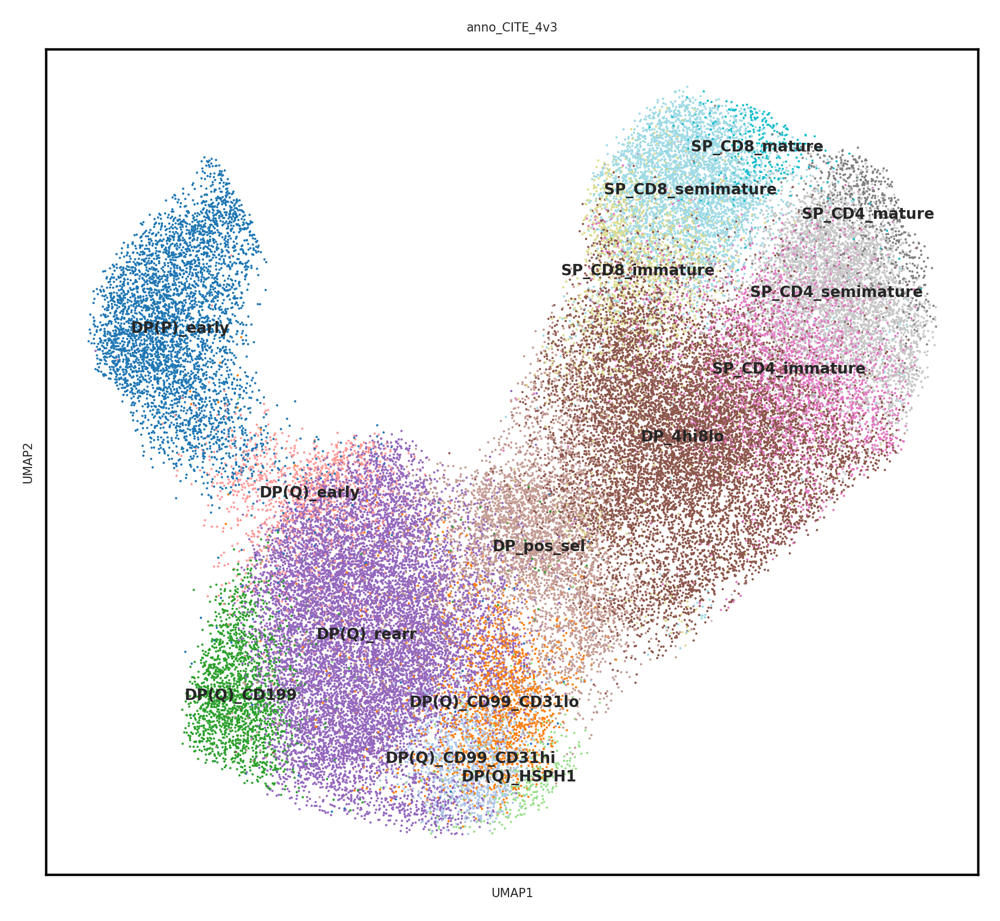

In [17]:
# take a look at the UMAP to make sure it looks reasonable i.e. different cell types are clustered separately
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = [5.5,5]
sc.pl.umap(bdata, color=['anno_CITE_4v3'], legend_fontsize=5,palette='tab20',legend_loc='on data')

In [18]:
import milopy
import milopy.core as milo

# use milo to sample neighbourhood
milo.make_nhoods(bdata)
# build neighbourhood adata in bdata.uns['nhood_adata']
milo.count_nhoods(bdata, sample_col='sample') # this step is needed to build bdata.uns['nhood_adata'] and sample_col can be anything
# this step is needed for plotting below
milopy.utils.build_nhood_graph(bdata)
# assign neighbourhood celltype by majority voting
# results are in bdata.uns['nhood_adata'].obs['nhood_annotation'] & bdata.uns['nhood_adata'].obs['nhood_annotation_frac'] 
milopy.utils.annotate_nhoods(bdata, anno_col='anno_CITE_4v3')
bdata

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.


AnnData object with n_obs × n_vars = 52245 × 36751
    obs: 'n_genes', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spli

In [131]:
bdata.uns['nhood_adata'].uns['annotation_labels'] = np.nan

bdata.write_h5ad('bdata.h5ad')

Now neighbourhood adata is stored in bdata.uns['nhood_adata']

# Create neighbourhood VDJ feature space

In [19]:
#### this option for DP
# function for making neighbourhood vdj feature space
nhood_adata = ddl.tl.vdj_pseudobulk(bdata, pbs = bdata.obsm['nhoods'], obs_to_take = 'anno_CITE_4v3', extract_cols=['v_call_abT_VDJ_main', 'j_call_abT_VDJ_main','v_call_abT_VJ_main', 'j_call_abT_VJ_main'])
nhood_adata

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.


AnnData object with n_obs × n_vars = 3712 × 166
    obs: 'anno_CITE_4v3', 'anno_CITE_4v3_fraction', 'cell_count'
    obsm: 'pbs'

     nhood_adata is the new neighbourhood VDJ feature space, whereby each observation is a cell neighbourhood
     VDJ usage frequency stored in nhood_adata.X
     VDJ genes stored in nhood_adata.var
     neighbourhood metadata stored in nhood_adata.obs
     can visualise the data using PCA or UMAP (see below)

In [20]:
# # sort out the annotation colour order
nhood_adata.obs['anno_CITE_4v3'] = nhood_adata.obs['anno_CITE_4v3'].astype('category')
nhood_adata.obs['anno_CITE_4v3'] = nhood_adata.obs['anno_CITE_4v3'].cat.reorder_categories(ct_order)

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


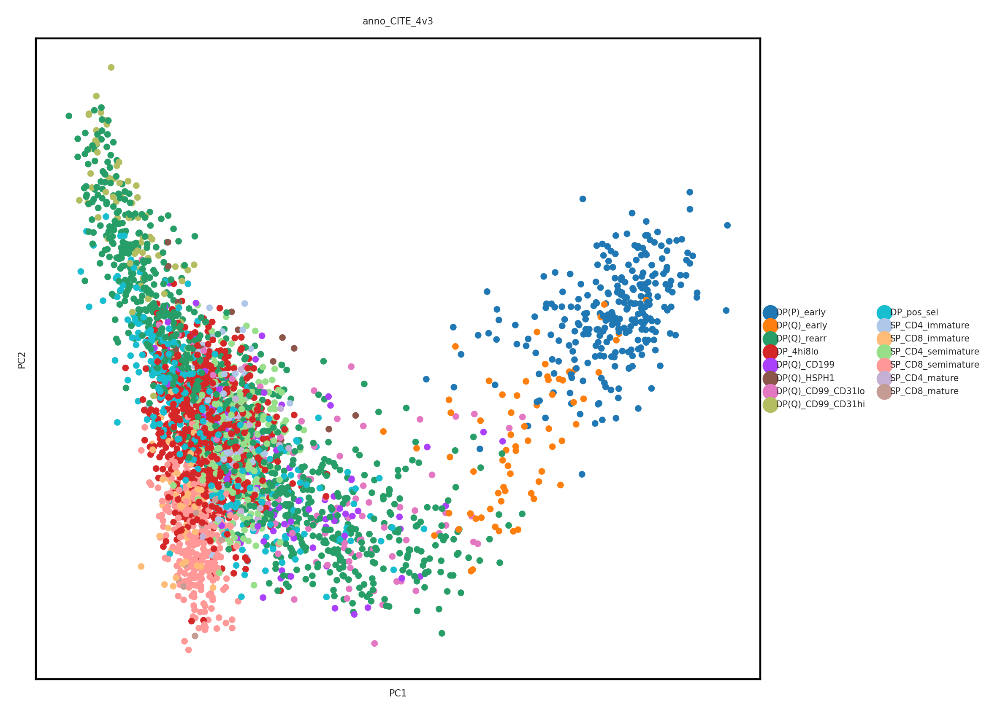

In [21]:
sc.pp.pca(nhood_adata, random_state = 1712)
sc.pl.pca(nhood_adata, color=['anno_CITE_4v3'])

In [22]:
sc.pp.neighbors(nhood_adata, random_state = 1712)
sc.tl.umap(nhood_adata, random_state = 1712)

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


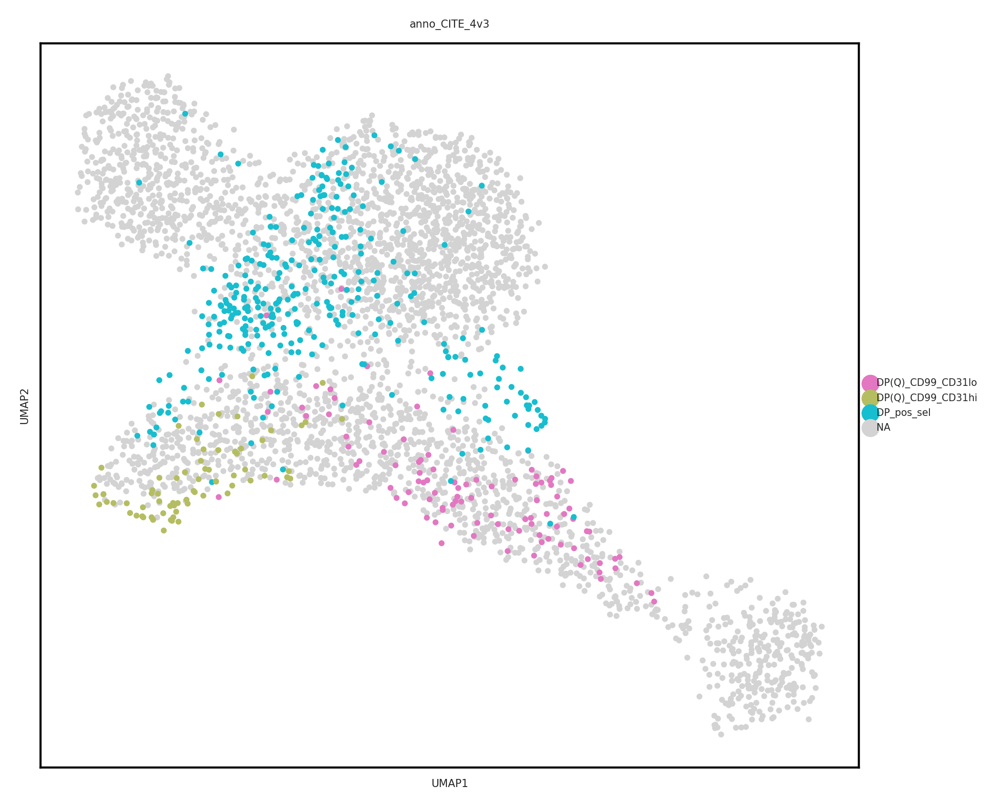

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


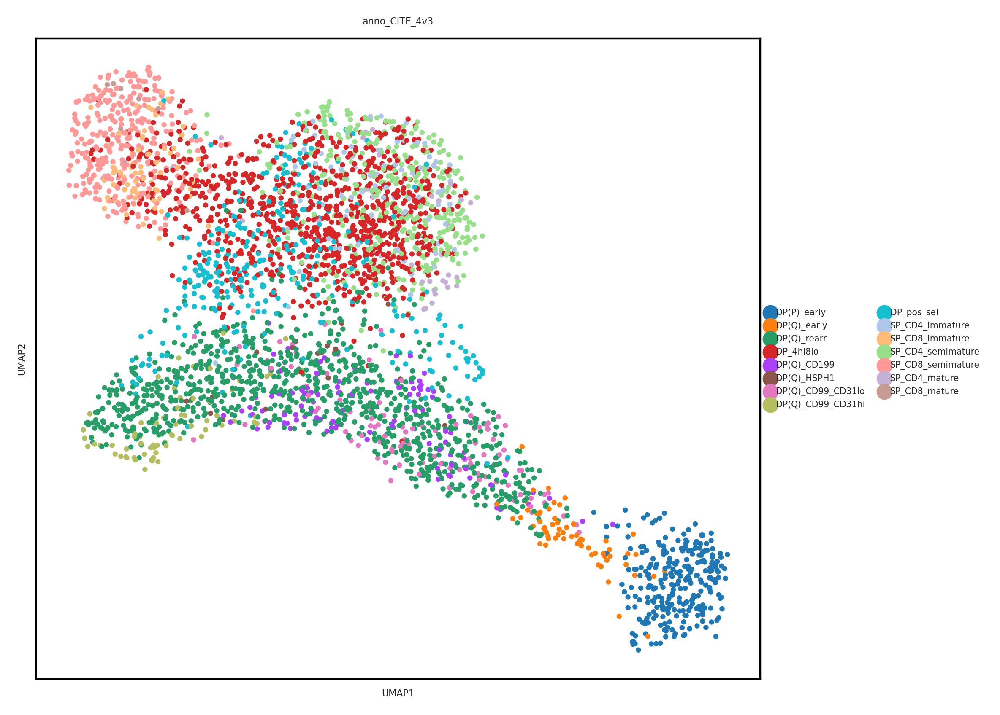

In [23]:
sc.pl.umap(nhood_adata, color=['anno_CITE_4v3'],groups=['DP(Q)_CD99_CD31lo','DP(Q)_CD99_CD31hi','DP_pos_sel'],s=20)
sc.pl.umap(nhood_adata, color=['anno_CITE_4v3'],s=20)

## Run Pseudotime on VDJ feature space

In [24]:
# make sure you install palantir if you don't already have it

# Run diffusion maps
pca_projections = pd.DataFrame(nhood_adata.obsm['X_pca'], index=nhood_adata.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections, n_components=10)
dm_res

Determing nearest neighbor graph...


{'T': <3712x3712 sparse matrix of type '<class 'numpy.float64'>'
 	with 182420 stored elements in Compressed Sparse Row format>,
 'EigenVectors':              0         1         2         3         4         5         6  \
 0    -0.016413 -0.055942  0.015597  0.003982  0.007485 -0.011587  0.006967   
 1    -0.016413 -0.055763  0.015321  0.003907  0.007309 -0.011280  0.006976   
 2    -0.016413 -0.054247  0.012655  0.003179  0.005419 -0.005529  0.002667   
 3    -0.016413 -0.055587  0.014915  0.003794  0.006978 -0.009868  0.005645   
 4    -0.016413 -0.055838  0.015489  0.003954  0.007449 -0.012109  0.007877   
 ...        ...       ...       ...       ...       ...       ...       ...   
 3707 -0.016413  0.005230 -0.004756  0.003244  0.006281 -0.017002 -0.018188   
 3708 -0.016413  0.005869 -0.001067 -0.002339  0.019021  0.010159  0.010352   
 3709 -0.016413  0.007160  0.008685  0.059667 -0.032143  0.017904  0.056524   
 3710 -0.016413  0.006712  0.005385  0.035268 -0.013804  0.003058

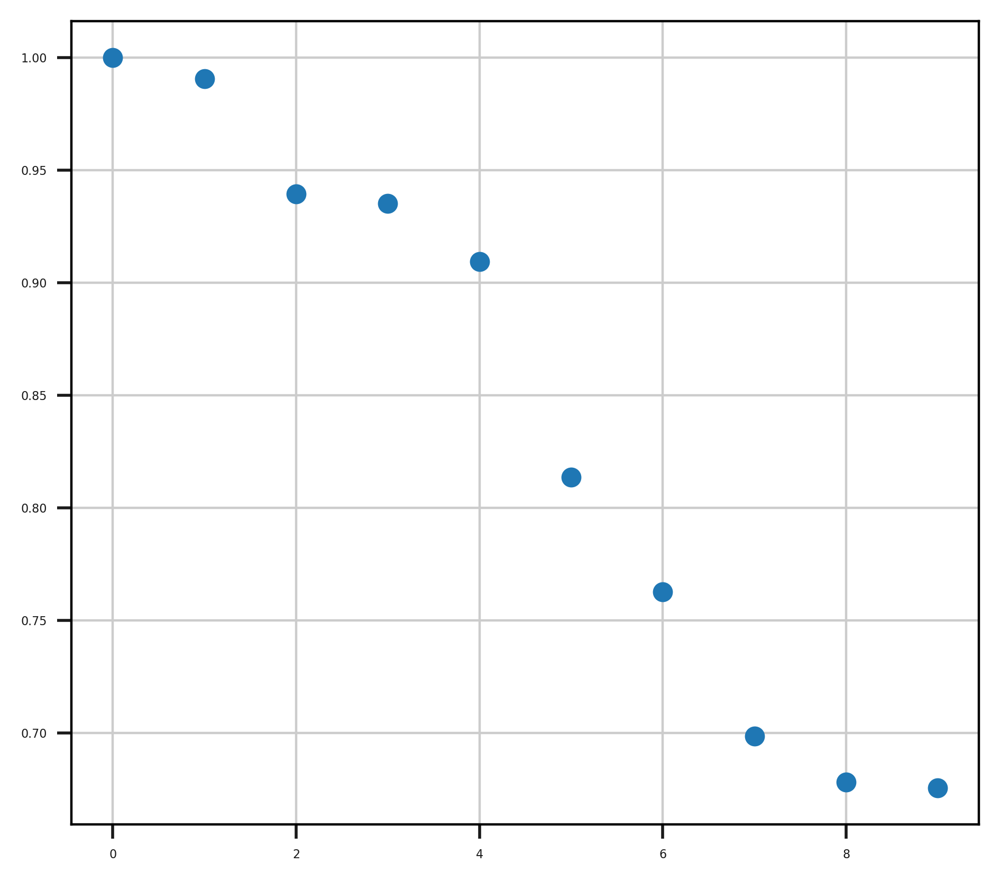

In [25]:
plt.scatter(np.arange(10), dm_res['EigenValues'])

In [26]:
# based on plot above, choose n_eigs
ms_data = palantir.utils.determine_multiscale_space(dm_res, n_eigs=5)

In [27]:
# select the start and end points
# start
tmp = nhood_adata[nhood_adata.obs['anno_CITE_4v3'] == 'DP(P)_early']
rootcell = np.argmax(tmp.obsm['X_umap'][:,0])
rootcell = tmp.obs_names[rootcell]
nhood_adata.obs['rootcell'] = 0
nhood_adata.obs.loc[rootcell,'rootcell'] = 1

In [35]:
# ends
tmp1 = nhood_adata[nhood_adata.obs['anno_CITE_4v3'] == 'SP_CD8_mature']
tmp2 = nhood_adata[nhood_adata.obs['anno_CITE_4v3'] == 'SP_CD4_mature']
endcell1 = np.argmax(tmp1.obsm['X_umap'][:,1])
endcell1 = tmp1.obs_names[endcell1]
endcell2 = np.argmax(tmp2.obsm['X_umap'][:,0])
endcell2 = tmp2.obs_names[endcell2]

terminal_states = pd.Series(['SP_CD8_mature', 'SP_CD4_mature'], 
                           index=[endcell1,endcell2])

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


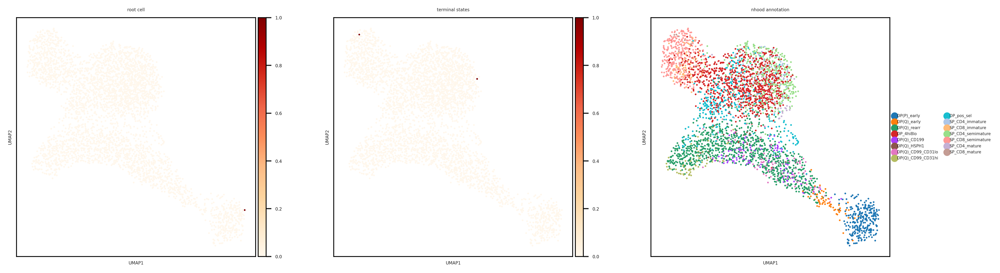

In [36]:
# plot rootcell and terminal states
nhood_adata.obs['terminal_states'] = 0
nhood_adata.obs.loc[terminal_states.index, 'terminal_states'] = 1
plt.rcParams["figure.figsize"] = [4,4]
sc.pl.umap(nhood_adata,color=['rootcell','terminal_states','anno_CITE_4v3'],
           title=['root cell','terminal states','nhood annotation'],color_map='OrRd',s=10)

In [37]:
pr_res = palantir.core.run_palantir(ms_data,  rootcell, num_waypoints=500, 
                                    terminal_states = terminal_states.index)

Sampling and flocking waypoints...
Time for determining waypoints: 0.005456260840098063 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling bac

Time for shortest paths: 0.2522094170252482 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [38]:
pr_res.branch_probs.columns = terminal_states[pr_res.branch_probs.columns]

## Visualise the data

In [39]:
ddl.tl.pseudotime_transfer(adata = nhood_adata, pr_res = pr_res, suffix = '_nhood_vdj')

AnnData object with n_obs × n_vars = 3712 × 166
    obs: 'anno_CITE_4v3', 'anno_CITE_4v3_fraction', 'cell_count', 'rootcell', 'terminal_states', 'pseudotime_nhood_vdj', 'prob_SP_CD4_mature_nhood_vdj', 'prob_SP_CD8_mature_nhood_vdj'
    uns: 'pca', 'anno_CITE_4v3_colors', 'neighbors', 'umap'
    obsm: 'pbs', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

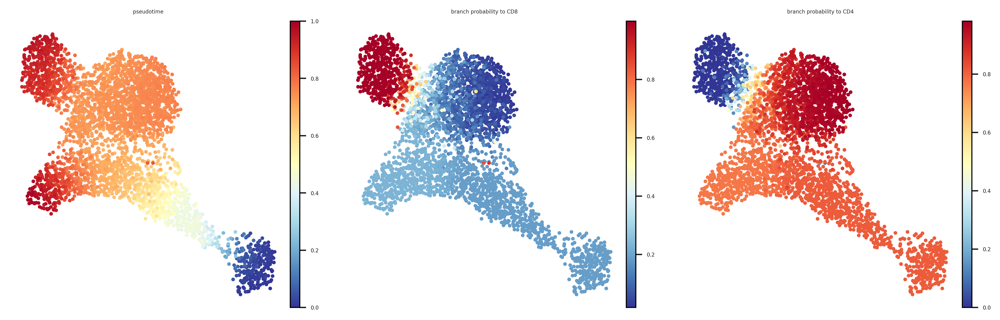

In [86]:
plt.rcParams["figure.figsize"] = [4,4]
plot = ['pseudotime', 'prob_SP_CD8_mature', 'prob_SP_CD4_mature']
sc.pl.umap(nhood_adata,color=[term + '_nhood_vdj' for term in plot],
           title=['pseudotime','branch probability to CD8',
                  'branch probability to CD4'],
           frameon=False,wspace=0.1,
           color_map = 'RdYlBu_r'
          )

In [132]:
# save nhood object
# nhood_adata.write_h5ad('nhood_adata.h5ad')
nhood_adata = sc.read_h5ad('nhood_adata.h5ad')

# end of testing 


## Project pseudotime and branch probabilities back to cells

In [100]:

# adata.obs['norm_'+anno] = s_normalized
# # project the nhood level pseudotime to cell level pseudotime.
# cdata = ddl.tl.project_pseudotime_to_cell(adata = bdata, 
#                                pb_adata = nhood_adata, 
#                                term_states=['SP_CD8_mature','SP_CD4_mature'], 
#                                suffix = '_nhood_vdj')

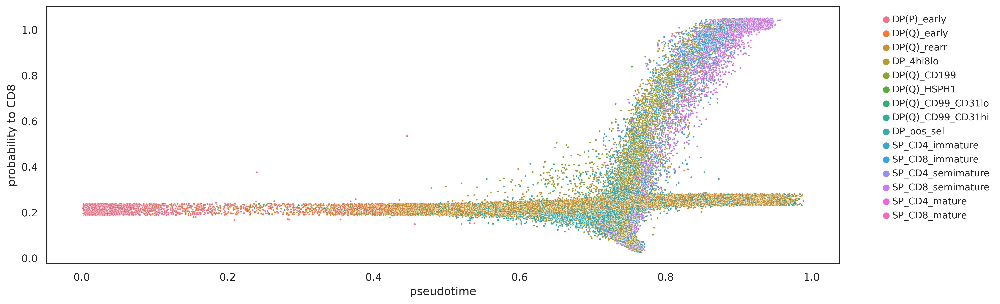

In [103]:
sns.set_theme(style='white')
fig, ax = plt.subplots(figsize=(15,5))
cdata.obs['anno_CITE_4v3'] = cdata.obs['anno_CITE_4v3'].cat.reorder_categories(ct_order)
df = cdata.obs.copy()
sigma = 0.05
df['prob_SP_CD8_mature_nhood_vdj'] = df['prob_SP_CD8_mature_nhood_vdj'] + (np.random.rand(len(df['prob_SP_CD8_mature_nhood_vdj'])))*sigma
ax= sns.scatterplot(data=df, 
                    x ='pseudotime_nhood_vdj',
                    y='prob_SP_CD8_mature_nhood_vdj',
                    s=4,
                    hue='anno_CITE_4v3',
                   )
ax.set_ylabel('probability to CD8')    
ax.set_xlabel('pseudotime')
ax.set_title('')
h,l = ax.get_legend_handles_labels()
l1 = ax.legend(h[:20],l[:20], loc='upper right',bbox_to_anchor=(1.2, 1),frameon=False, fontsize='small')
# plt.savefig(fig_path+'/pseudotime_scatterplot_nhood_vdj.pdf',bbox_inches='tight')

# look at the TRAV/J expression in DP(Q) that are beyond the bifurcation point

In [121]:
# # look at TRAV/TRAJ expression 
bulk_adata = ddl.tl.vdj_pseudobulk(adata = cdata, obs_to_bulk = ['anno_CITE_4v3_pseudotime_bin'], obs_to_take = ['anno_CITE_4v3_pseudotime_bin'],
                                   extract_cols= ['v_call_abT_VDJ_main', 'j_call_abT_VDJ_main','v_call_abT_VJ_main', 'j_call_abT_VJ_main'])

In [122]:
# load TCR list by location - lists in github folder metadata/TCR_genes
TCR_list_by_loc_dict = {}
for chain in ['TRAV','TRAJ']:
    path = '/lustre/scratch126/cellgen/team205/cs42/VDJ_collab_manuscript/gene_list/'+chain+'_list_by_location.csv'
    TCR_list_by_loc_dict[chain] = list(pd.read_csv(path, header=None)[0])

In [123]:
gene_intersection = [gene for gene in TCR_list_by_loc_dict['TRAV'] if gene in bulk_adata.var_names] +[gene for gene in TCR_list_by_loc_dict['TRAJ'] if gene in bulk_adata.var_names] 
trav = pd.DataFrame(index = bulk_adata.obs['anno_CITE_4v3_pseudotime_bin'], columns = gene_intersection,
                    data = bulk_adata[:,gene_intersection].X)
trav = trav

In [124]:

ct_order = ['DP(P)_early','DP(Q)_rearr_bin_1','DP(Q)_rearr_bin_2','DP(Q)_rearr_bin_3','DP(Q)_rearr_bin_4','DP(Q)_rearr_bin_5','DP_pos_sel',
                'SP_CD4_immature','SP_CD4_semimature','SP_CD4_mature', 'SP_CD8_immature', 'SP_CD8_semimature','SP_CD8_mature']
trav = trav.reindex(ct_order)


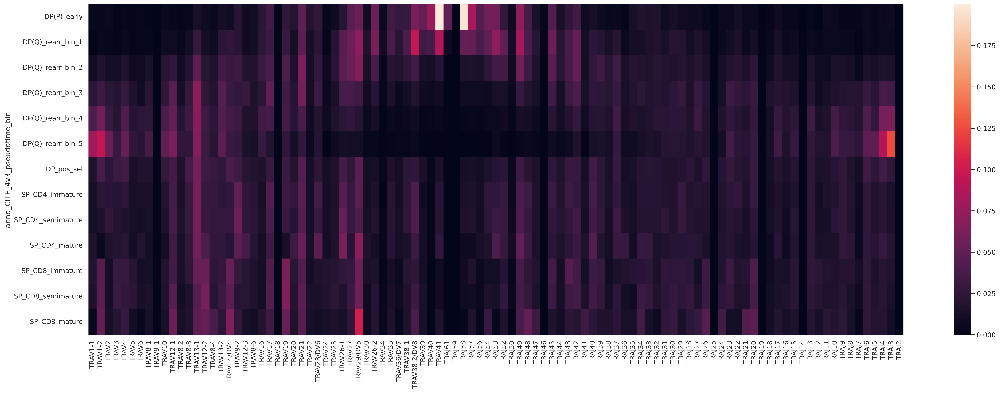

In [129]:
plt.rcParams["figure.figsize"] = [30,10]
svm = sns.heatmap(trav)
figure = svm.get_figure()    
figure.savefig(fig_path+'/vdj_usage.pdf', dpi=200)
# pseudotime_scatterplot_nhood_vdj.pdf',bbox_inches='tight'
# DP_late is using the end of TRAV/TRAJv


In [104]:
# return annotations to original object 
adata_abtcr

AnnData object with n_obs × n_vars = 127654 × 36751
    obs: 'n_genes', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spl

In [103]:
cdata

AnnData object with n_obs × n_vars = 52094 × 36751
    obs: 'n_genes', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spli

In [106]:

adata_abtcr.obs['pseudotime_nhood_vdj'] = cdata.obs['pseudotime_nhood_vdj']
adata_abtcr.obs['prob_SP_CD8_mature_nhood_vdj'] = cdata.obs['prob_SP_CD8_mature_nhood_vdj']
adata_abtcr.obs['prob_SP_CD4_mature_nhood_vdj'] = cdata.obs['prob_SP_CD4_mature_nhood_vdj']

In [7]:
plt.rcParams["figure.figsize"] = [10,10]

sc.pl.umap(adata_abtcr, color=['anno_CITE_4v3','pseudotime_nhood_vdj','prob_SP_CD8_mature_nhood_vdj','prob_SP_CD4_mature_nhood_vdj'],cmap='jet', legend_fontsize=1,palette='tab20',legend_loc='on data')

In [110]:
adata_abtcr.write()

In [5]:
adata_abtcr = sc.read()

In [ ]:
adata_abtcr.obs.to_csv()